In [134]:
# ===================== IMPORTS AND SETUP =====================
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
import matplotlib.pyplot as plt
import pickle
import warnings
import random

warnings.filterwarnings('ignore')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [135]:
# ===================== DATASET CLASS =====================
class PlantDiseaseDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, torch.tensor(label, dtype=torch.long)

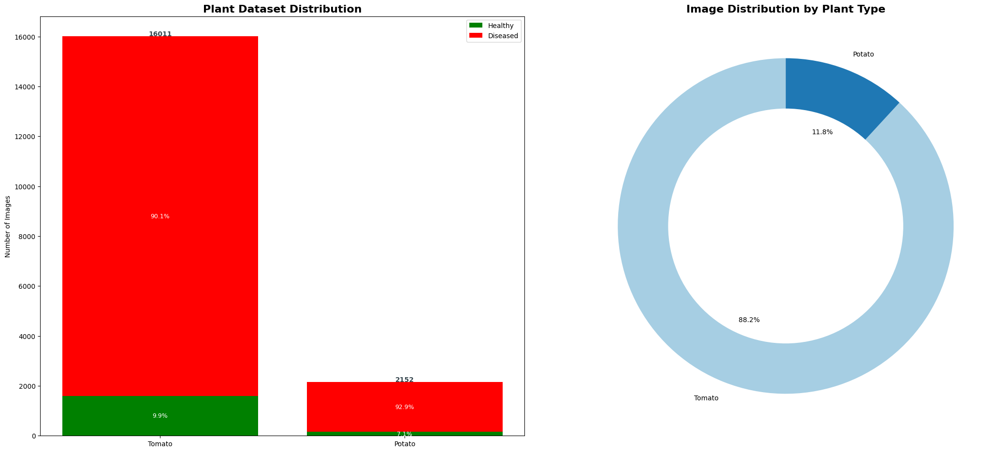

In [136]:
#Dataset Distribution Chart
import os
import matplotlib.pyplot as plt

def plot_dataset_distribution(data_dir):
    plants_set = set()
    plant_totals = {}
    healthy_counts = {}
    diseased_counts = {}

    # Parse folders
    for folder in os.listdir(data_dir):
        folder_path = os.path.join(data_dir, folder)
        if os.path.isdir(folder_path):
            plant_type = folder.split("___")[0] if "___" in folder else folder.split("_")[0]
            plants_set.add(plant_type)

            # Count image files
            image_count = len([f for f in os.listdir(folder_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))])
            plant_totals[plant_type] = plant_totals.get(plant_type, 0) + image_count

            if "healthy" in folder.lower():
                healthy_counts[plant_type] = healthy_counts.get(plant_type, 0) + image_count
            else:
                diseased_counts[plant_type] = diseased_counts.get(plant_type, 0) + image_count

    # Sort plants by total image count
    plants = sorted(list(plants_set), key=lambda p: plant_totals.get(p, 0), reverse=True)

    # Rebuild counts based on sorted plant list
    healthy_vals = [healthy_counts.get(p, 0) for p in plants]
    diseased_vals = [diseased_counts.get(p, 0) for p in plants]
    total_vals = [plant_totals.get(p, 0) for p in plants]

    # Plotting
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10))

    # Stacked bar chart
    ax1.bar(plants, healthy_vals, label='Healthy', color='green')
    ax1.bar(plants, diseased_vals, label='Diseased', color='red', bottom=healthy_vals)

    ax1.set_title('Plant Dataset Distribution', fontsize=16, fontweight='bold')
    ax1.set_ylabel('Number of Images')
    ax1.legend()

    for i, (healthy, diseased, total) in enumerate(zip(healthy_vals, diseased_vals, total_vals)):
        ax1.text(i, healthy + diseased + 20, f'{total}', ha='center', fontsize=10, fontweight='bold', color='#37474F')
        if total > 0:
            ax1.text(i, healthy / 2, f'{(healthy / total) * 100:.1f}%', ha='center', va='center', color='white', fontsize=9)
            ax1.text(i, healthy + diseased / 2, f'{(diseased / total) * 100:.1f}%', ha='center', va='center', color='white', fontsize=9)

    # Pie chart
    ax2.pie(total_vals, labels=plants, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
    ax2.set_title('Image Distribution by Plant Type', fontsize=16, fontweight='bold')
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    ax2.add_artist(centre_circle)

    plt.tight_layout(pad=3.0)
    plt.show()

plot_dataset_distribution("dataset")

In [137]:
# ===================== DATA LOADING AND TRANSFORMS =====================
def get_transforms(image_size):
    train_transform = transforms.Compose([
        transforms.Resize((image_size + 32, image_size + 32)),
        transforms.RandomCrop((image_size, image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(30),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    valid_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    return train_transform, valid_transform

def load_data(data_dir):
    image_paths = []
    labels = []
    for disease_folder in os.listdir(data_dir):
        folder_path = os.path.join(data_dir, disease_folder)
        if not os.path.isdir(folder_path):
            continue
        for img_name in os.listdir(folder_path):
            if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths.append(os.path.join(folder_path, img_name))
                labels.append(disease_folder)
    return image_paths, labels

def prepare_data(data_dir, image_size, batch_size, train_transform, valid_transform):
    print("Loading data...")
    image_paths, labels = load_data(data_dir)
    label_encoder = LabelEncoder()
    labels_encoded = label_encoder.fit_transform(labels)
    with open('label_encoder.pkl', 'wb') as f:
        pickle.dump(label_encoder, f)
    print("Splitting dataset...")
    train_paths, temp_paths, train_labels, temp_labels = train_test_split(
        image_paths, labels_encoded, test_size=0.3, stratify=labels_encoded, random_state=42
    )
    valid_paths, test_paths, valid_labels, test_labels = train_test_split(
        temp_paths, temp_labels, test_size=0.5, stratify=temp_labels, random_state=42
    )
    print("Creating datasets...")
    train_dataset = PlantDiseaseDataset(train_paths, train_labels, train_transform)
    valid_dataset = PlantDiseaseDataset(valid_paths, valid_labels, valid_transform)
    test_dataset = PlantDiseaseDataset(test_paths, test_labels, valid_transform)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    valid_loader = DataLoader(valid_dataset, batch_size=batch_size)
    test_loader = DataLoader(test_dataset, batch_size=batch_size)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}")
    print(f"Number of test samples: {len(test_dataset)}")
    return train_loader, valid_loader, test_loader, len(label_encoder.classes_)

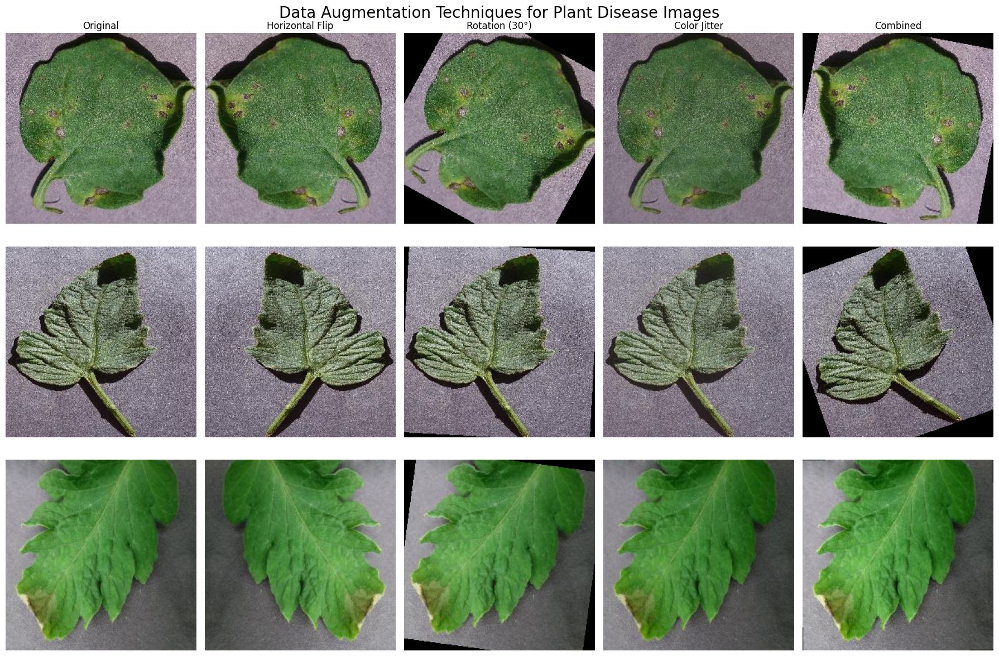

In [138]:
#Data Augmentation
def show_augmentations(data_dir, num_plants=3):
    disease_folders = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))]
    selected_folders = random.sample(disease_folders, min(num_plants, len(disease_folders)))
    
    # Define augmentations to display like the training used one.
    augmentations = [
        ("Original", transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])),
        ("Horizontal Flip", transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.RandomHorizontalFlip(p=1.0),
            transforms.ToTensor()
        ])),
        ("Rotation (30°)", transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.RandomRotation(30),
            transforms.ToTensor()
        ])),
        ("Color Jitter", transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
            transforms.ToTensor()
        ])),
        ("Combined", transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(20),
            transforms.ColorJitter(brightness=0.1, contrast=0.1),
            transforms.ToTensor()
        ]))
    ]
    
    fig, axes = plt.subplots(len(selected_folders), len(augmentations), figsize=(18, 4 * len(selected_folders)))
    
    for i, folder in enumerate(selected_folders):
        folder_path = os.path.join(data_dir, folder)
        
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if not img_files:
            continue
            
        img_path = os.path.join(folder_path, random.choice(img_files))
        original_img = Image.open(img_path).convert('RGB')
        
        for j, (aug_name, transform) in enumerate(augmentations):
            img_tensor = transform(original_img)
            
            img_np = img_tensor.permute(1, 2, 0).numpy()
            
            ax = axes[i, j] if len(selected_folders) > 1 else axes[j]
            ax.imshow(img_np)
            
            if i == 0:
                ax.set_title(aug_name, fontsize=12)
                
            if j == 0:
                disease_name = folder.replace('_', ' ')
                ax.set_ylabel(disease_name, fontsize=10)
                
            ax.axis('off')
    
    plt.tight_layout()
    plt.suptitle("Data Augmentation Techniques for Plant Disease Images", fontsize=20, y=1.0)
    plt.show()

show_augmentations("dataset")

In [ ]:
import matplotlib.pyplot as plt

# -- DATA PREP (run this cell, then you can always plot) --
IMAGE_SIZE = 224
BATCH_SIZE = 32

train_transform, valid_transform = get_transforms(IMAGE_SIZE)
train_loader, valid_loader, test_loader, num_classes = prepare_data(
    "dataset", IMAGE_SIZE, BATCH_SIZE, train_transform, valid_transform
)

# -- VISUALIZATION FUNCTIONS --
def plot_dataset_split_from_loaders(train_loader, valid_loader, test_loader):
    train_count = len(train_loader.dataset)
    valid_count = len(valid_loader.dataset)
    test_count = len(test_loader.dataset)
    labels = ['Train', 'Validation', 'Test']
    counts = [train_count, valid_count, test_count]
    total = sum(counts)
    percentages = [count / total * 100 for count in counts]

    plt.figure(figsize=(8, 5))
    bars = plt.bar(labels, counts, color=["#388e3c", "#1976d2", "#d32f2f"], edgecolor="black")
    plt.ylabel('Number of Images', fontsize=13)
    plt.title('Dataset Split Overview', fontsize=15, weight='bold')
    for i, bar in enumerate(bars):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + (total * 0.01),
                 f"{counts[i]} ({percentages[i]:.1f}%)",
                 ha='center', va='bottom', fontsize=13, fontweight='bold')
    plt.ylim(0, max(counts) * 1.18)
    plt.show()

def plot_dataset_pie_from_loaders(train_loader, valid_loader, test_loader):
    train_count = len(train_loader.dataset)
    valid_count = len(valid_loader.dataset)
    test_count = len(test_loader.dataset)
    labels = ['Train', 'Validation', 'Test']
    counts = [train_count, valid_count, test_count]
    colors = ["#388e3c", "#1976d2", "#d32f2f"]

    plt.figure(figsize=(6, 6))
    plt.pie(counts, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90, textprops={'fontsize': 13})
    plt.title('Dataset Split Proportion', fontsize=15, weight='bold')
    plt.gca().add_artist(plt.Circle((0,0),0.70,fc='white'))  # donut style
    plt.show()

# -- CALL THE FUNCTIONS (now guaranteed to work) --
plot_dataset_split_from_loaders(train_loader, valid_loader, test_loader)
plot_dataset_pie_from_loaders(train_loader, valid_loader, test_loader)

In [139]:
# ===================== MODEL ARCHITECTURES =====================
class ImprovedPlantDiseaseModel(nn.Module):
    def __init__(self, num_classes, dropout_rate=0.3):
        super(ImprovedPlantDiseaseModel, self).__init__()
        self.backbone = models.resnet50(pretrained=True)
        for param in list(self.backbone.parameters())[:-30]:
            param.requires_grad = False
        num_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Sequential(
            nn.Linear(num_features, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(512, num_classes)
        )
    def forward(self, x):
        return self.backbone(x)

class ImprovedPlantDiseaseModel_EfficientNet(nn.Module):
    def __init__(self, num_classes):
        super(ImprovedPlantDiseaseModel_EfficientNet, self).__init__()
        self.efficientnet = models.efficientnet_b0(pretrained=True)
        for param in list(self.efficientnet.parameters())[:-4]:
            param.requires_grad = False
        num_ftrs = self.efficientnet.classifier[1].in_features
        self.efficientnet.classifier = nn.Sequential(
            nn.Dropout(p=0.2),
            nn.Linear(num_ftrs, num_classes)
        )
    def forward(self, x):
        return self.efficientnet(x)

In [140]:
# ===================== MODEL LOADER / SAVER =====================
def load_trained_model(model_class, num_classes, model_path, device):
    model = model_class(num_classes)
    model = model.to(device)
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path, map_location=device))
        print(f"Loaded pretrained model weights from {model_path}")
    else:
        print("No pretrained model found, using fresh model.")
    return model

In [141]:
# ===================== TRAINING FUNCTION (WITH TEST ACCURACY) =====================
def eval_model(model, data_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, targets in data_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()
    acc = 100. * correct / total
    return acc

def train_model(model, train_loader, valid_loader, test_loader, num_epochs=30, save_path="best_model.pth"):
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
    scheduler = optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=0.001,
        epochs=num_epochs,
        steps_per_epoch=len(train_loader),
        pct_start=0.3
    )

    best_val_acc = 0.0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': [], 'test_acc': []}

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        correct = 0
        total = 0
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
        for inputs, targets in progress_bar:
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            scheduler.step()
            train_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()
            progress_bar.set_postfix({'loss': f'{loss.item():.3f}', 'acc': f'{100.*correct/total:.2f}%'})

        train_acc = 100. * correct / total
        train_loss = train_loss / len(train_loader)

        model.eval()
        val_loss = 0
        correct = 0
        total = 0

        with torch.no_grad():
            for inputs, targets in valid_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item()
                _, predicted = outputs.max(1)
                total += targets.size(0)
                correct += predicted.eq(targets).sum().item()

        val_acc = 100. * correct / total
        val_loss = val_loss / len(valid_loader)

        test_acc = eval_model(model, test_loader)

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['test_acc'].append(test_acc)

        print(f'\nEpoch: {epoch+1}')
        print(f'Train Loss: {train_loss:.3f} | Train Acc: {train_acc:.3f}%')
        print(f'Val Loss: {val_loss:.3f} | Val Acc: {val_acc:.3f}%')
        print(f'Test Acc: {test_acc:.3f}%')

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), save_path)
            print(f'Saved best model with validation accuracy: {val_acc:.3f}%')

    return model, history

In [142]:
# ===================== MAIN TRAINING FUNCTIONS =====================
def main_resnet50(force_retrain=False):
    IMAGE_SIZE = 224
    BATCH_SIZE = 32
    NUM_EPOCHS = 30
    MODEL_PATH = "best_model.pth"

    train_transform, valid_transform = get_transforms(IMAGE_SIZE)
    train_loader, valid_loader, test_loader, num_classes = prepare_data(
        "dataset", IMAGE_SIZE, BATCH_SIZE, train_transform, valid_transform
    )

    needs_training = force_retrain or not os.path.exists(MODEL_PATH)
    if needs_training:
        model = ImprovedPlantDiseaseModel(num_classes)
        trained_model, history = train_model(
            model, train_loader, valid_loader, test_loader, NUM_EPOCHS, save_path=MODEL_PATH
        )
    else:
        model = load_trained_model(ImprovedPlantDiseaseModel, num_classes, MODEL_PATH, device)
        history = None  # For best accuracy, retrain or log history to file

    return model, history

def main_efficientnet(force_retrain=False):
    IMAGE_SIZE = 224
    BATCH_SIZE = 32
    NUM_EPOCHS = 30
    MODEL_PATH = "efficientnet_model.pth"

    train_transform, valid_transform = get_transforms(IMAGE_SIZE)
    train_loader, valid_loader, test_loader, num_classes = prepare_data(
        "dataset", IMAGE_SIZE, BATCH_SIZE, train_transform, valid_transform
    )

    needs_training = force_retrain or not os.path.exists(MODEL_PATH)
    if needs_training:
        model = ImprovedPlantDiseaseModel_EfficientNet(num_classes)
        trained_model, history = train_model(
            model, train_loader, valid_loader, test_loader, NUM_EPOCHS, save_path=MODEL_PATH
        )
    else:
        model = load_trained_model(ImprovedPlantDiseaseModel_EfficientNet, num_classes, MODEL_PATH, device)
        history = None

    return model, history

In [143]:
# ===================== PREDICTION FUNCTION =====================
def predict_single_image(model, image_path):
    with open('label_encoder.pkl', 'rb') as f:
        label_encoder = pickle.load(f)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(image_tensor)
        probs = torch.nn.functional.softmax(outputs, dim=1)[0]
        confidence = torch.max(probs).item() * 100
        pred_class = label_encoder.inverse_transform([torch.argmax(probs).item()])[0]
    return pred_class, confidence

In [144]:
# ===================== LIST TEST IMAGES =====================
def show_available_test_images(data_dir):
    available_images = []
    for disease_folder in os.listdir(data_dir):
        folder_path = os.path.join(data_dir, disease_folder)
        if os.path.isdir(folder_path):
            for img_name in os.listdir(folder_path):
                if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                    img_path = os.path.join(folder_path, img_name)
                    available_images.append(img_path)
    print(f"Found {len(available_images)} images")
    print("\nExample image paths:")
    for path in random.sample(available_images, min(5, len(available_images))):
        print(path)
    return available_images

Loading data...
Splitting dataset...
Creating datasets...
Number of training samples: 12714
Number of validation samples: 2724
Number of test samples: 2725


Epoch 1/30: 100%|██████████| 398/398 [08:29<00:00,  1.28s/it, loss=0.393, acc=82.20%]



Epoch: 1
Train Loss: 0.620 | Train Acc: 82.201%
Val Loss: 0.336 | Val Acc: 90.675%
Test Acc: 89.248%
Saved best model with validation accuracy: 90.675%


Epoch 2/30: 100%|██████████| 398/398 [04:33<00:00,  1.46it/s, loss=1.322, acc=92.91%]



Epoch: 2
Train Loss: 0.238 | Train Acc: 92.913%
Val Loss: 0.252 | Val Acc: 91.410%
Test Acc: 90.495%
Saved best model with validation accuracy: 91.410%


Epoch 3/30: 100%|██████████| 398/398 [02:43<00:00,  2.43it/s, loss=0.392, acc=92.31%]



Epoch: 3
Train Loss: 0.240 | Train Acc: 92.308%
Val Loss: 0.332 | Val Acc: 89.354%
Test Acc: 88.404%


Epoch 4/30: 100%|██████████| 398/398 [03:20<00:00,  1.99it/s, loss=0.137, acc=91.93%]



Epoch: 4
Train Loss: 0.249 | Train Acc: 91.930%
Val Loss: 0.367 | Val Acc: 88.656%
Test Acc: 88.110%


Epoch 5/30: 100%|██████████| 398/398 [03:07<00:00,  2.12it/s, loss=0.098, acc=92.10%]



Epoch: 5
Train Loss: 0.234 | Train Acc: 92.103%
Val Loss: 0.284 | Val Acc: 90.529%
Test Acc: 89.835%


Epoch 6/30: 100%|██████████| 398/398 [03:07<00:00,  2.12it/s, loss=0.243, acc=93.80%]



Epoch: 6
Train Loss: 0.194 | Train Acc: 93.802%
Val Loss: 0.249 | Val Acc: 92.034%
Test Acc: 92.073%
Saved best model with validation accuracy: 92.034%


Epoch 7/30: 100%|██████████| 398/398 [03:12<00:00,  2.07it/s, loss=0.175, acc=94.52%]



Epoch: 7
Train Loss: 0.172 | Train Acc: 94.518%
Val Loss: 0.300 | Val Acc: 90.712%
Test Acc: 89.872%


Epoch 8/30: 100%|██████████| 398/398 [03:03<00:00,  2.17it/s, loss=0.048, acc=94.84%]



Epoch: 8
Train Loss: 0.155 | Train Acc: 94.840%
Val Loss: 0.251 | Val Acc: 91.373%
Test Acc: 91.560%


Epoch 9/30: 100%|██████████| 398/398 [02:59<00:00,  2.22it/s, loss=0.125, acc=95.69%]



Epoch: 9
Train Loss: 0.131 | Train Acc: 95.690%
Val Loss: 0.281 | Val Acc: 90.896%
Test Acc: 89.982%


Epoch 10/30: 100%|██████████| 398/398 [03:09<00:00,  2.10it/s, loss=0.051, acc=95.86%]



Epoch: 10
Train Loss: 0.126 | Train Acc: 95.863%
Val Loss: 0.205 | Val Acc: 93.319%
Test Acc: 92.073%
Saved best model with validation accuracy: 93.319%


Epoch 11/30: 100%|██████████| 398/398 [03:00<00:00,  2.21it/s, loss=0.066, acc=96.44%]



Epoch: 11
Train Loss: 0.104 | Train Acc: 96.445%
Val Loss: 0.133 | Val Acc: 95.852%
Test Acc: 94.936%
Saved best model with validation accuracy: 95.852%


Epoch 12/30: 100%|██████████| 398/398 [02:55<00:00,  2.27it/s, loss=0.084, acc=96.97%]



Epoch: 12
Train Loss: 0.093 | Train Acc: 96.972%
Val Loss: 0.131 | Val Acc: 96.072%
Test Acc: 95.853%
Saved best model with validation accuracy: 96.072%


Epoch 13/30: 100%|██████████| 398/398 [03:04<00:00,  2.15it/s, loss=0.048, acc=96.97%]



Epoch: 13
Train Loss: 0.089 | Train Acc: 96.972%
Val Loss: 0.156 | Val Acc: 94.493%
Test Acc: 94.055%


Epoch 14/30: 100%|██████████| 398/398 [05:07<00:00,  1.29it/s, loss=0.002, acc=97.45%]



Epoch: 14
Train Loss: 0.077 | Train Acc: 97.452%
Val Loss: 0.113 | Val Acc: 96.219%
Test Acc: 94.642%
Saved best model with validation accuracy: 96.219%


Epoch 15/30: 100%|██████████| 398/398 [10:13<00:00,  1.54s/it, loss=0.056, acc=97.81%]



Epoch: 15
Train Loss: 0.065 | Train Acc: 97.813%
Val Loss: 0.181 | Val Acc: 94.273%
Test Acc: 92.624%


Epoch 16/30: 100%|██████████| 398/398 [04:18<00:00,  1.54it/s, loss=0.002, acc=97.81%]



Epoch: 16
Train Loss: 0.060 | Train Acc: 97.813%
Val Loss: 0.163 | Val Acc: 94.934%
Test Acc: 93.872%


Epoch 17/30: 100%|██████████| 398/398 [12:10<00:00,  1.84s/it, loss=0.035, acc=98.36%]



Epoch: 17
Train Loss: 0.051 | Train Acc: 98.356%
Val Loss: 0.136 | Val Acc: 96.109%
Test Acc: 94.826%


Epoch 18/30: 100%|██████████| 398/398 [04:35<00:00,  1.45it/s, loss=0.174, acc=98.58%]



Epoch: 18
Train Loss: 0.044 | Train Acc: 98.584%
Val Loss: 0.162 | Val Acc: 94.567%
Test Acc: 93.174%


Epoch 19/30: 100%|██████████| 398/398 [16:32<00:00,  2.49s/it, loss=0.007, acc=98.51%] 



Epoch: 19
Train Loss: 0.044 | Train Acc: 98.513%
Val Loss: 0.145 | Val Acc: 94.714%
Test Acc: 94.239%


Epoch 20/30: 100%|██████████| 398/398 [06:40<00:00,  1.01s/it, loss=1.379, acc=98.60%]



Epoch: 20
Train Loss: 0.043 | Train Acc: 98.600%
Val Loss: 0.100 | Val Acc: 96.549%
Test Acc: 95.817%
Saved best model with validation accuracy: 96.549%


Epoch 21/30: 100%|██████████| 398/398 [02:56<00:00,  2.26it/s, loss=0.012, acc=98.88%]



Epoch: 21
Train Loss: 0.037 | Train Acc: 98.875%
Val Loss: 0.102 | Val Acc: 96.549%
Test Acc: 95.560%


Epoch 22/30: 100%|██████████| 398/398 [02:46<00:00,  2.40it/s, loss=0.055, acc=98.97%]



Epoch: 22
Train Loss: 0.028 | Train Acc: 98.970%
Val Loss: 0.070 | Val Acc: 97.687%
Test Acc: 97.064%
Saved best model with validation accuracy: 97.687%


Epoch 23/30: 100%|██████████| 398/398 [03:04<00:00,  2.16it/s, loss=0.453, acc=99.17%]



Epoch: 23
Train Loss: 0.027 | Train Acc: 99.166%
Val Loss: 0.078 | Val Acc: 97.430%
Test Acc: 95.596%


Epoch 24/30: 100%|██████████| 398/398 [03:16<00:00,  2.03it/s, loss=0.069, acc=99.36%]



Epoch: 24
Train Loss: 0.019 | Train Acc: 99.363%
Val Loss: 0.102 | Val Acc: 96.549%
Test Acc: 95.266%


Epoch 25/30: 100%|██████████| 398/398 [03:23<00:00,  1.95it/s, loss=0.076, acc=99.47%]



Epoch: 25
Train Loss: 0.016 | Train Acc: 99.465%
Val Loss: 0.082 | Val Acc: 96.990%
Test Acc: 95.963%


Epoch 26/30: 100%|██████████| 398/398 [03:06<00:00,  2.14it/s, loss=0.030, acc=99.52%]



Epoch: 26
Train Loss: 0.015 | Train Acc: 99.520%
Val Loss: 0.069 | Val Acc: 97.687%
Test Acc: 96.257%


Epoch 27/30: 100%|██████████| 398/398 [02:59<00:00,  2.21it/s, loss=0.052, acc=99.47%]



Epoch: 27
Train Loss: 0.015 | Train Acc: 99.473%
Val Loss: 0.061 | Val Acc: 97.907%
Test Acc: 96.771%
Saved best model with validation accuracy: 97.907%


Epoch 28/30: 100%|██████████| 398/398 [03:50<00:00,  1.73it/s, loss=0.006, acc=99.49%]



Epoch: 28
Train Loss: 0.015 | Train Acc: 99.489%
Val Loss: 0.068 | Val Acc: 97.871%
Test Acc: 96.294%


Epoch 29/30: 100%|██████████| 398/398 [03:46<00:00,  1.76it/s, loss=0.001, acc=99.58%]



Epoch: 29
Train Loss: 0.013 | Train Acc: 99.583%
Val Loss: 0.083 | Val Acc: 97.357%
Test Acc: 95.560%


Epoch 30/30: 100%|██████████| 398/398 [03:26<00:00,  1.93it/s, loss=0.004, acc=99.57%]



Epoch: 30
Train Loss: 0.013 | Train Acc: 99.567%
Val Loss: 0.090 | Val Acc: 97.100%
Test Acc: 95.376%
Loading data...
Splitting dataset...
Creating datasets...
Number of training samples: 12714
Number of validation samples: 2724
Number of test samples: 2725


Epoch 1/30: 100%|██████████| 398/398 [02:33<00:00,  2.59it/s, loss=2.205, acc=34.50%]



Epoch: 1
Train Loss: 2.256 | Train Acc: 34.497%
Val Loss: 2.009 | Val Acc: 53.451%
Test Acc: 55.266%
Saved best model with validation accuracy: 53.451%


Epoch 2/30: 100%|██████████| 398/398 [02:32<00:00,  2.61it/s, loss=1.072, acc=62.29%]



Epoch: 2
Train Loss: 1.623 | Train Acc: 62.294%
Val Loss: 1.372 | Val Acc: 67.364%
Test Acc: 68.294%
Saved best model with validation accuracy: 67.364%


Epoch 3/30: 100%|██████████| 398/398 [02:12<00:00,  3.01it/s, loss=1.429, acc=73.67%]



Epoch: 3
Train Loss: 1.062 | Train Acc: 73.667%
Val Loss: 0.925 | Val Acc: 75.808%
Test Acc: 77.028%
Saved best model with validation accuracy: 75.808%


Epoch 4/30: 100%|██████████| 398/398 [12:25<00:00,  1.87s/it, loss=0.487, acc=80.69%]



Epoch: 4
Train Loss: 0.716 | Train Acc: 80.691%
Val Loss: 0.687 | Val Acc: 80.507%
Test Acc: 81.358%
Saved best model with validation accuracy: 80.507%


Epoch 5/30: 100%|██████████| 398/398 [07:18<00:00,  1.10s/it, loss=0.911, acc=82.72%]



Epoch: 5
Train Loss: 0.583 | Train Acc: 82.720%
Val Loss: 0.546 | Val Acc: 84.655%
Test Acc: 84.991%
Saved best model with validation accuracy: 84.655%


Epoch 6/30: 100%|██████████| 398/398 [02:10<00:00,  3.05it/s, loss=0.534, acc=84.84%]



Epoch: 6
Train Loss: 0.487 | Train Acc: 84.836%
Val Loss: 0.469 | Val Acc: 86.087%
Test Acc: 86.532%
Saved best model with validation accuracy: 86.087%


Epoch 7/30: 100%|██████████| 398/398 [02:00<00:00,  3.29it/s, loss=0.804, acc=85.89%]



Epoch: 7
Train Loss: 0.436 | Train Acc: 85.890%
Val Loss: 0.416 | Val Acc: 87.151%
Test Acc: 87.780%
Saved best model with validation accuracy: 87.151%


Epoch 8/30: 100%|██████████| 398/398 [02:04<00:00,  3.20it/s, loss=0.174, acc=86.35%]



Epoch: 8
Train Loss: 0.420 | Train Acc: 86.346%
Val Loss: 0.432 | Val Acc: 86.490%
Test Acc: 87.009%


Epoch 9/30: 100%|██████████| 398/398 [02:02<00:00,  3.25it/s, loss=0.556, acc=86.01%]



Epoch: 9
Train Loss: 0.413 | Train Acc: 86.008%
Val Loss: 0.425 | Val Acc: 86.307%
Test Acc: 86.092%


Epoch 10/30: 100%|██████████| 398/398 [02:04<00:00,  3.20it/s, loss=0.210, acc=87.18%]



Epoch: 10
Train Loss: 0.387 | Train Acc: 87.179%
Val Loss: 0.399 | Val Acc: 86.307%
Test Acc: 87.450%


Epoch 11/30: 100%|██████████| 398/398 [02:09<00:00,  3.07it/s, loss=0.353, acc=87.31%]



Epoch: 11
Train Loss: 0.376 | Train Acc: 87.313%
Val Loss: 0.378 | Val Acc: 87.372%
Test Acc: 88.440%
Saved best model with validation accuracy: 87.372%


Epoch 12/30: 100%|██████████| 398/398 [02:01<00:00,  3.28it/s, loss=0.607, acc=87.54%]



Epoch: 12
Train Loss: 0.374 | Train Acc: 87.541%
Val Loss: 0.393 | Val Acc: 86.931%
Test Acc: 87.633%


Epoch 13/30: 100%|██████████| 398/398 [01:58<00:00,  3.36it/s, loss=0.671, acc=87.58%]



Epoch: 13
Train Loss: 0.379 | Train Acc: 87.581%
Val Loss: 0.346 | Val Acc: 88.399%
Test Acc: 89.028%
Saved best model with validation accuracy: 88.399%


Epoch 14/30: 100%|██████████| 398/398 [01:56<00:00,  3.42it/s, loss=0.417, acc=87.47%]



Epoch: 14
Train Loss: 0.375 | Train Acc: 87.471%
Val Loss: 0.365 | Val Acc: 87.739%
Test Acc: 88.294%


Epoch 15/30: 100%|██████████| 398/398 [01:52<00:00,  3.54it/s, loss=0.880, acc=87.49%]



Epoch: 15
Train Loss: 0.369 | Train Acc: 87.494%
Val Loss: 0.370 | Val Acc: 87.775%
Test Acc: 88.110%


Epoch 16/30: 100%|██████████| 398/398 [01:56<00:00,  3.40it/s, loss=0.608, acc=87.79%]



Epoch: 16
Train Loss: 0.359 | Train Acc: 87.793%
Val Loss: 0.347 | Val Acc: 88.473%
Test Acc: 89.101%
Saved best model with validation accuracy: 88.473%


Epoch 17/30: 100%|██████████| 398/398 [01:50<00:00,  3.62it/s, loss=0.474, acc=88.19%]



Epoch: 17
Train Loss: 0.347 | Train Acc: 88.186%
Val Loss: 0.361 | Val Acc: 88.032%
Test Acc: 88.183%


Epoch 18/30: 100%|██████████| 398/398 [01:48<00:00,  3.67it/s, loss=0.110, acc=88.18%]



Epoch: 18
Train Loss: 0.343 | Train Acc: 88.178%
Val Loss: 0.361 | Val Acc: 88.179%
Test Acc: 88.257%


Epoch 19/30: 100%|██████████| 398/398 [01:51<00:00,  3.57it/s, loss=0.277, acc=88.39%]



Epoch: 19
Train Loss: 0.342 | Train Acc: 88.391%
Val Loss: 0.315 | Val Acc: 89.868%
Test Acc: 89.798%
Saved best model with validation accuracy: 89.868%


Epoch 20/30: 100%|██████████| 398/398 [02:04<00:00,  3.20it/s, loss=1.569, acc=88.29%]



Epoch: 20
Train Loss: 0.341 | Train Acc: 88.289%
Val Loss: 0.336 | Val Acc: 89.097%
Test Acc: 89.284%


Epoch 21/30: 100%|██████████| 398/398 [01:50<00:00,  3.60it/s, loss=0.120, acc=88.40%]



Epoch: 21
Train Loss: 0.344 | Train Acc: 88.399%
Val Loss: 0.322 | Val Acc: 89.427%
Test Acc: 89.688%


Epoch 22/30: 100%|██████████| 398/398 [02:01<00:00,  3.27it/s, loss=0.326, acc=88.31%]



Epoch: 22
Train Loss: 0.349 | Train Acc: 88.312%
Val Loss: 0.331 | Val Acc: 88.767%
Test Acc: 89.505%


Epoch 23/30: 100%|██████████| 398/398 [01:55<00:00,  3.44it/s, loss=0.333, acc=89.15%]



Epoch: 23
Train Loss: 0.332 | Train Acc: 89.154%
Val Loss: 0.332 | Val Acc: 89.023%
Test Acc: 89.101%


Epoch 24/30: 100%|██████████| 398/398 [01:50<00:00,  3.60it/s, loss=0.136, acc=88.38%]



Epoch: 24
Train Loss: 0.340 | Train Acc: 88.383%
Val Loss: 0.333 | Val Acc: 89.207%
Test Acc: 88.954%


Epoch 25/30: 100%|██████████| 398/398 [02:04<00:00,  3.21it/s, loss=0.087, acc=89.16%]



Epoch: 25
Train Loss: 0.323 | Train Acc: 89.162%
Val Loss: 0.320 | Val Acc: 89.427%
Test Acc: 89.908%


Epoch 26/30: 100%|██████████| 398/398 [01:57<00:00,  3.39it/s, loss=0.342, acc=88.64%]



Epoch: 26
Train Loss: 0.332 | Train Acc: 88.642%
Val Loss: 0.350 | Val Acc: 88.473%
Test Acc: 88.734%


Epoch 27/30: 100%|██████████| 398/398 [02:08<00:00,  3.09it/s, loss=1.025, acc=89.37%]



Epoch: 27
Train Loss: 0.325 | Train Acc: 89.374%
Val Loss: 0.316 | Val Acc: 89.537%
Test Acc: 90.239%


Epoch 28/30: 100%|██████████| 398/398 [02:05<00:00,  3.17it/s, loss=0.419, acc=89.00%]



Epoch: 28
Train Loss: 0.323 | Train Acc: 88.996%
Val Loss: 0.311 | Val Acc: 89.905%
Test Acc: 90.202%
Saved best model with validation accuracy: 89.905%


Epoch 29/30: 100%|██████████| 398/398 [01:56<00:00,  3.40it/s, loss=0.609, acc=88.66%]



Epoch: 29
Train Loss: 0.329 | Train Acc: 88.658%
Val Loss: 0.333 | Val Acc: 89.060%
Test Acc: 88.991%


Epoch 30/30: 100%|██████████| 398/398 [01:52<00:00,  3.54it/s, loss=0.259, acc=88.63%]



Epoch: 30
Train Loss: 0.337 | Train Acc: 88.627%
Val Loss: 0.321 | Val Acc: 89.648%
Test Acc: 89.725%
Found 18163 images

Example image paths:
dataset\Tomato_Early_blight\3889a459-3e30-4345-83e1-57c68b32af30___RS_Erly.B 7638.JPG
dataset\Tomato__Tomato_YellowLeaf__Curl_Virus\61a02dc7-93ec-46d6-8150-2d565563fc5e___UF.GRC_YLCV_Lab 08440.JPG
dataset\Tomato_Spider_mites_Two_spotted_spider_mite\116999e1-33f4-41bc-a3a3-fbb3332bf143___Com.G_SpM_FL 1603.JPG
dataset\Tomato__Tomato_YellowLeaf__Curl_Virus\54447643-06bc-4315-be51-0e8126fae338___UF.GRC_YLCV_Lab 02262.JPG
dataset\Tomato_Leaf_Mold\f7826d86-2eb1-408f-b2c1-a43afe0268b3___Crnl_L.Mold 9056.JPG
ResNet50 - Predicted: Potato___Early_blight, Confidence: 100.00%
EfficientNet - Predicted: Potato___Early_blight, Confidence: 99.54%


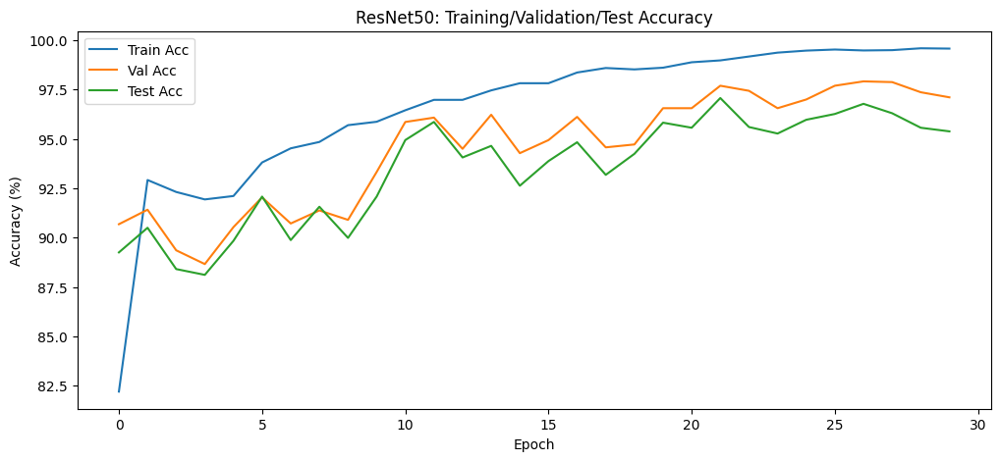

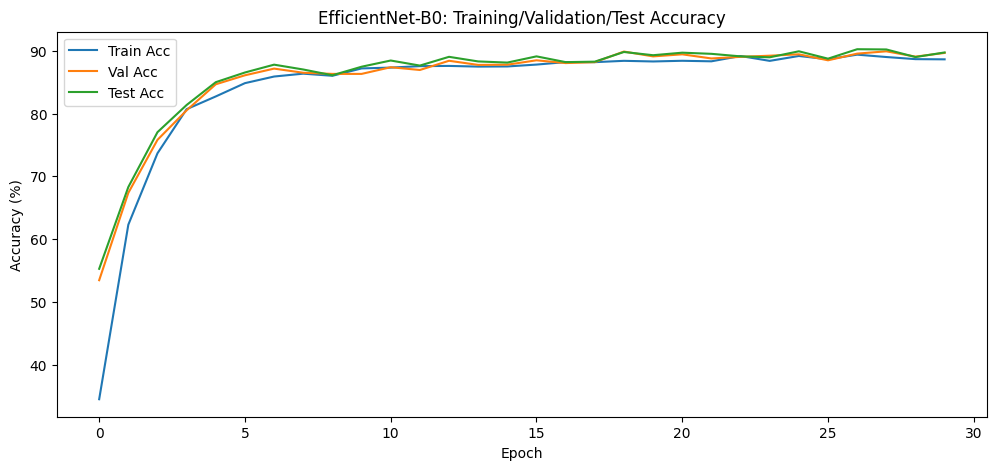

In [145]:
# ===================== TRAIN & TEST =====================
if __name__ == "__main__":
    # Train or load ResNet50
    model_resnet50, history_resnet = main_resnet50()
    # Train or load EfficientNetB0
    model_efficientnet, history_efficient = main_efficientnet()
    
    # Use for inference:
    test_images = show_available_test_images("dataset")
    test_image_path = test_images[0]

    pred_class, confidence = predict_single_image(model_resnet50, test_image_path)
    print(f"ResNet50 - Predicted: {pred_class}, Confidence: {confidence:.2f}%")
    pred_class2, confidence2 = predict_single_image(model_efficientnet, test_image_path)
    print(f"EfficientNet - Predicted: {pred_class2}, Confidence: {confidence2:.2f}%")

    # (Optional) Plot test/train/val accuracy if trained anew
    if history_resnet:
        plt.figure(figsize=(12, 5))
        plt.plot(history_resnet['train_acc'], label='Train Acc')
        plt.plot(history_resnet['val_acc'], label='Val Acc')
        plt.plot(history_resnet['test_acc'], label='Test Acc')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy (%)')
        plt.legend()
        plt.title('ResNet50: Training/Validation/Test Accuracy')
        plt.show()
    if history_efficient:
        plt.figure(figsize=(12, 5))
        plt.plot(history_efficient['train_acc'], label='Train Acc')
        plt.plot(history_efficient['val_acc'], label='Val Acc')
        plt.plot(history_efficient['test_acc'], label='Test Acc')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy (%)')
        plt.legend()
        plt.title('EfficientNet-B0: Training/Validation/Test Accuracy')
        plt.show()


Using device: cuda
Successfully loaded label encoder with 13 classes
Test loader created successfully

Starting model evaluation...

Evaluating ResNet50:


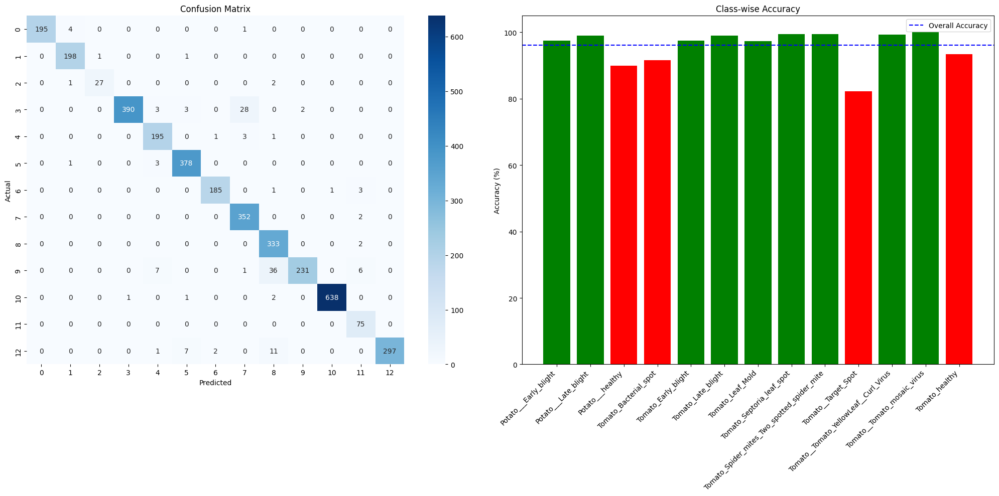


Detailed Performance Metrics:

Overall Accuracy: 96.17%

Class-wise Accuracy:
Potato___Early_blight: 97.50%
Potato___Late_blight: 99.00%
Potato___healthy: 90.00%
Tomato_Bacterial_spot: 91.55%
Tomato_Early_blight: 97.50%
Tomato_Late_blight: 98.95%
Tomato_Leaf_Mold: 97.37%
Tomato_Septoria_leaf_spot: 99.44%
Tomato_Spider_mites_Two_spotted_spider_mite: 99.40%
Tomato__Target_Spot: 82.21%
Tomato__Tomato_YellowLeaf__Curl_Virus: 99.38%
Tomato__Tomato_mosaic_virus: 100.00%
Tomato_healthy: 93.40%

Classification Report:
                                             precision    recall  f1-score   support

                      Potato___Early_blight      1.000     0.975     0.987       200
                       Potato___Late_blight      0.971     0.990     0.980       200
                           Potato___healthy      0.964     0.900     0.931        30
                      Tomato_Bacterial_spot      0.997     0.915     0.955       426
                        Tomato_Early_blight      0.933   

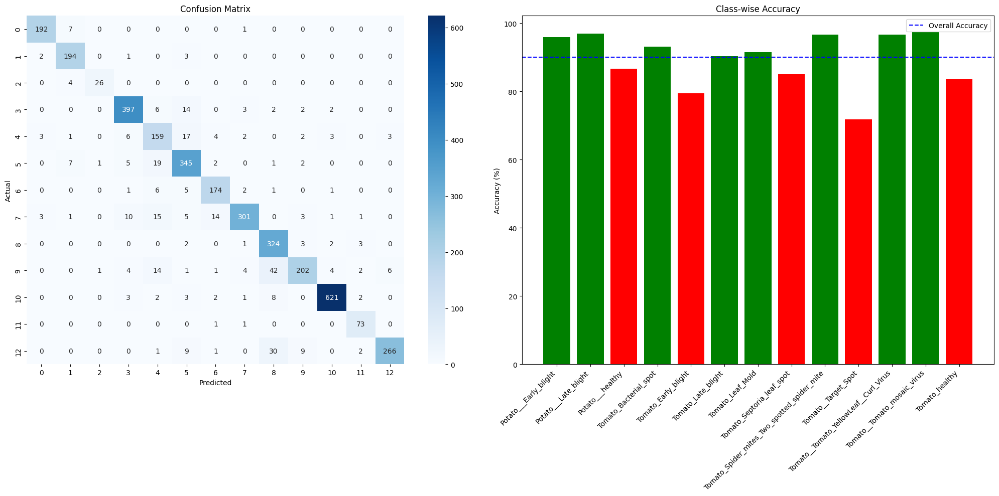


Detailed Performance Metrics:

Overall Accuracy: 90.12%

Class-wise Accuracy:
Potato___Early_blight: 96.00%
Potato___Late_blight: 97.00%
Potato___healthy: 86.67%
Tomato_Bacterial_spot: 93.19%
Tomato_Early_blight: 79.50%
Tomato_Late_blight: 90.31%
Tomato_Leaf_Mold: 91.58%
Tomato_Septoria_leaf_spot: 85.03%
Tomato_Spider_mites_Two_spotted_spider_mite: 96.72%
Tomato__Target_Spot: 71.89%
Tomato__Tomato_YellowLeaf__Curl_Virus: 96.73%
Tomato__Tomato_mosaic_virus: 97.33%
Tomato_healthy: 83.65%

Classification Report:
                                             precision    recall  f1-score   support

                      Potato___Early_blight      0.960     0.960     0.960       200
                       Potato___Late_blight      0.907     0.970     0.937       200
                           Potato___healthy      0.929     0.867     0.897        30
                      Tomato_Bacterial_spot      0.930     0.932     0.931       426
                        Tomato_Early_blight      0.716    

<Figure size 1200x600 with 0 Axes>

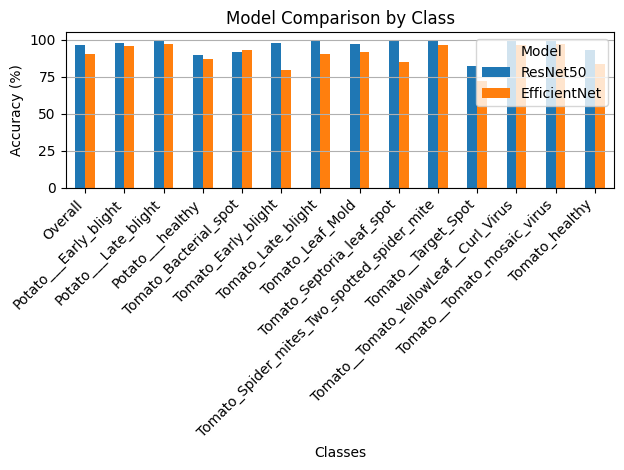

In [154]:
import torch
import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import pandas as pd
from torchvision import transforms
from torch.utils.data import DataLoader
from PIL import Image
import os
from sklearn.model_selection import train_test_split

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load the label encoder
try:
    with open('label_encoder.pkl', 'rb') as f:
        label_encoder = pickle.load(f)
    print(f"Successfully loaded label encoder with {len(label_encoder.classes_)} classes")
except Exception as e:
    print(f"Error loading label encoder: {str(e)}")
    raise

# Define the Dataset class
class PlantDiseaseDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)

        return img, torch.tensor(label, dtype=torch.long)

# Load and prepare test data
def get_data_paths(data_dir):
    image_paths = []
    labels = []
    
    for class_idx, class_name in enumerate(sorted(os.listdir(data_dir))):
        class_dir = os.path.join(data_dir, class_name)
        if os.path.isdir(class_dir):
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    image_paths.append(os.path.join(class_dir, img_name))
                    labels.append(class_idx)
    
    return image_paths, labels

# Get all data paths
image_paths, labels = get_data_paths("dataset")

# Split data
train_paths, test_paths, train_labels, test_labels = train_test_split(
    image_paths, labels, test_size=0.2, random_state=42, stratify=labels
)

# Create test dataset and loader
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = PlantDiseaseDataset(test_paths, test_labels, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
print("Test loader created successfully")

def evaluate_pretrained_model(model, test_loader, device, label_encoder):
    """
    Evaluate the pretrained model and display detailed metrics
    """
    model.eval()
    all_predictions = []
    all_labels = []
    correct = 0
    total = 0
    
    # Set up lists to store class-wise accuracies
    class_correct = [0] * len(label_encoder.classes_)
    class_total = [0] * len(label_encoder.classes_)
    
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            
            # Overall accuracy
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # Store predictions and labels for detailed metrics
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            
            # Class-wise accuracy
            c = (predicted == labels).squeeze()
            for i in range(len(labels)):
                label = labels[i]
                class_correct[label] += c[i].item()
                class_total[label] += 1
    
    # Calculate overall accuracy
    overall_accuracy = 100 * correct / total
    
    # Calculate class-wise accuracies
    class_accuracies = {}
    for i in range(len(label_encoder.classes_)):
        if class_total[i] > 0:  # Avoid division by zero
            accuracy = 100 * class_correct[i] / class_total[i]
            class_accuracies[label_encoder.classes_[i]] = accuracy
    
    # Create confusion matrix
    cm = confusion_matrix(all_labels, all_predictions)
    
    # Plotting
    plt.figure(figsize=(20, 10))
    
    # 1. Confusion Matrix
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    
    # 2. Class-wise Accuracy Bar Plot
    plt.subplot(1, 2, 2)
    classes = list(class_accuracies.keys())
    accuracies = list(class_accuracies.values())
    
    colors = ['green' if acc >= overall_accuracy else 'red' for acc in accuracies]
    plt.bar(range(len(classes)), accuracies, color=colors)
    plt.axhline(y=overall_accuracy, color='blue', linestyle='--', label='Overall Accuracy')
    plt.xticks(range(len(classes)), classes, rotation=45, ha='right')
    plt.title('Class-wise Accuracy')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed metrics
    print("\nDetailed Performance Metrics:")
    print("=" * 50)
    print(f"\nOverall Accuracy: {overall_accuracy:.2f}%")
    
    print("\nClass-wise Accuracy:")
    for class_name, accuracy in class_accuracies.items():
        print(f"{class_name}: {accuracy:.2f}%")
    
    print("\nClassification Report:")
    print(classification_report(all_labels, all_predictions, 
                              target_names=label_encoder.classes_,
                              digits=3))
    
    # Calculate additional metrics
    print("\nAdditional Metrics:")
    print(f"Standard Deviation of Class Accuracies: {np.std(list(class_accuracies.values())):.2f}%")
    print(f"Worst Performing Class: {min(class_accuracies.items(), key=lambda x: x[1])[0]}")
    print(f"Best Performing Class: {max(class_accuracies.items(), key=lambda x: x[1])[0]}")
    
    return {
        'overall_accuracy': overall_accuracy,
        'class_accuracies': class_accuracies,
        'confusion_matrix': cm,
        'predictions': all_predictions,
        'true_labels': all_labels
    }

# Verify models are available and evaluate
print("\nStarting model evaluation...")

try:
    if 'model_resnet50' in globals():
        print("\nEvaluating ResNet50:")
        resnet_metrics = evaluate_pretrained_model(model_resnet50, test_loader, device, label_encoder)
        print(f"\nResNet50 Overall Accuracy: {resnet_metrics['overall_accuracy']:.2f}%")
    else:
        print("ResNet50 model not found")

    if 'model_efficientnet' in globals():
        print("\nEvaluating EfficientNet:")
        efficientnet_metrics = evaluate_pretrained_model(model_efficientnet, test_loader, device, label_encoder)
        print(f"\nEfficientNet Overall Accuracy: {efficientnet_metrics['overall_accuracy']:.2f}%")
    else:
        print("EfficientNet model not found")

    # Compare models if both are available
    if 'model_resnet50' in globals() and 'model_efficientnet' in globals():
        print("\nModel Comparison:")
        print("=" * 50)
        
        comparison_data = {
            'ResNet50': [resnet_metrics['overall_accuracy']] + list(resnet_metrics['class_accuracies'].values()),
            'EfficientNet': [efficientnet_metrics['overall_accuracy']] + list(efficientnet_metrics['class_accuracies'].values())
        }
        
        comparison_df = pd.DataFrame(
            comparison_data,
            index=['Overall'] + list(resnet_metrics['class_accuracies'].keys())
        )
        
        print("\nAccuracy Comparison:")
        print(comparison_df)
        
        plt.figure(figsize=(12, 6))
        comparison_df.plot(kind='bar')
        plt.title('Model Comparison by Class')
        plt.ylabel('Accuracy (%)')
        plt.xlabel('Classes')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title='Model')
        plt.grid(True, axis='y')
        plt.tight_layout()
        plt.show()

except Exception as e:
    print(f"Error during evaluation: {str(e)}")
    print("Make sure models are properly loaded and test_loader is defined.")

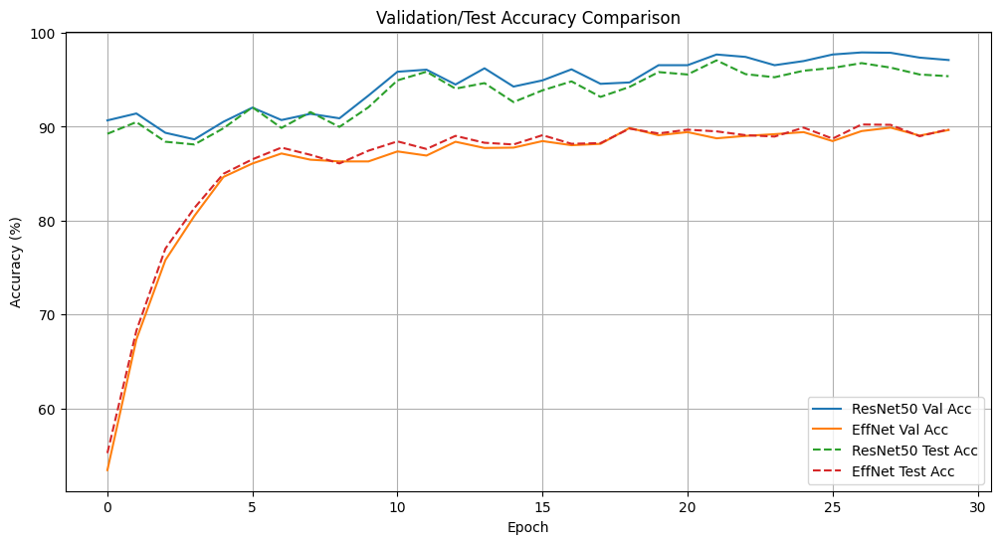


===== Model comparison summary =====
ResNet50:   Final Val acc:  97.10%,  Final Test acc: 95.38%
EffNet-B0:  Final Val acc:  89.65%,  Final Test acc: 89.72%
ResNet50:   Best validation acc: 97.91% (epoch 27)
EffNet-B0:  Best validation acc: 89.90% (epoch 28)

Recommendation: Use ResNet50 - it achieved higher test accuracy.


'ResNet50'

In [147]:
def compare_models(history_resnet, history_efficient):
    """
    Compares two model training histories and recommends which to use.
    Arguments:
      history_resnet: training history dict for ResNet50 (should include 'val_acc' and 'test_acc')
      history_efficient: training history dict for EfficientNet (should include 'val_acc' and 'test_acc')
    Prints and plots comparison.
    """
    import matplotlib.pyplot as plt

    if history_resnet is None or history_efficient is None:
        print("Both model histories required for comparison. Re-train models to obtain histories.")
        return

    # Plot Valid/Test Accuracies
    plt.figure(figsize=(12,6))
    plt.plot(history_resnet['val_acc'], label="ResNet50 Val Acc")
    plt.plot(history_efficient['val_acc'], label="EffNet Val Acc")
    plt.plot(history_resnet['test_acc'], '--', label="ResNet50 Test Acc")
    plt.plot(history_efficient['test_acc'], '--', label="EffNet Test Acc")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.title("Validation/Test Accuracy Comparison")
    plt.legend()
    plt.grid()
    plt.show()

    print("\n===== Model comparison summary =====")
    print(f"ResNet50:   Final Val acc:  {history_resnet['val_acc'][-1]:.2f}%,  Final Test acc: {history_resnet['test_acc'][-1]:.2f}%")
    print(f"EffNet-B0:  Final Val acc:  {history_efficient['val_acc'][-1]:.2f}%,  Final Test acc: {history_efficient['test_acc'][-1]:.2f}%")

    # Find best epoch by validation acc
    best_val_acc_resnet = max(history_resnet['val_acc'])
    best_val_epoch_resnet = history_resnet['val_acc'].index(best_val_acc_resnet) + 1
    best_val_acc_eff = max(history_efficient['val_acc'])
    best_val_epoch_eff = history_efficient['val_acc'].index(best_val_acc_eff) + 1
    print(f"ResNet50:   Best validation acc: {best_val_acc_resnet:.2f}% (epoch {best_val_epoch_resnet})")
    print(f"EffNet-B0:  Best validation acc: {best_val_acc_eff:.2f}% (epoch {best_val_epoch_eff})")

    # Pick best
    resnet_test = history_resnet['test_acc'][-1]
    effnet_test = history_efficient['test_acc'][-1]

    if resnet_test > effnet_test:
        print("\nRecommendation: Use ResNet50 - it achieved higher test accuracy.")
        best_model_flag = "ResNet50"
    elif resnet_test < effnet_test:
        print("\nRecommendation: Use EfficientNet-B0 - it achieved higher test accuracy.")
        best_model_flag = "EfficientNet-B0"
    else:
        print("\nBoth models achieved equal test accuracy. Use the simpler/smaller model: EfficientNet-B0 recommended in this case.")
        best_model_flag = "EfficientNet-B0"

    return best_model_flag
compare_models(history_resnet, history_efficient)

Starting feature map visualization...

Visualizing ResNet50 feature maps:

Analyzing image: b5f3f7a5-26ab-4696-b94e-9f2d7c472254___RS_Late.B 6074.JPG
Class: Tomato_Late_blight


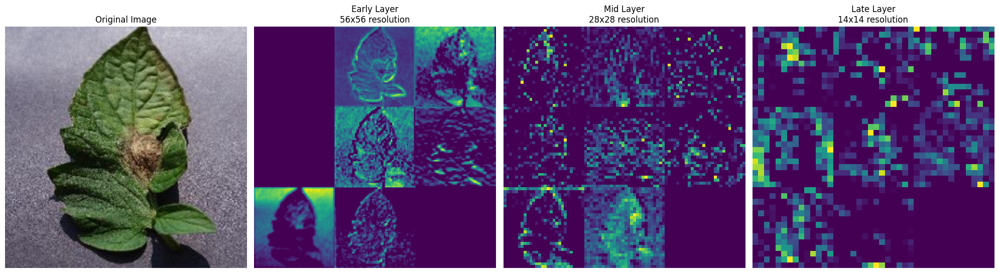


Feature Map Statistics:

early_layer:
Shape: torch.Size([256, 56, 56])
Mean activation: 0.1237
Std deviation: 0.1517
Max activation: 1.4896
Min activation: 0.0000

mid_layer:
Shape: torch.Size([512, 28, 28])
Mean activation: 0.1000
Std deviation: 0.1551
Max activation: 2.0185
Min activation: 0.0000

late_layer:
Shape: torch.Size([1024, 14, 14])
Mean activation: 0.0738
Std deviation: 0.1301
Max activation: 1.7847
Min activation: 0.0000

Analyzing image: 7b2a8123-3905-48d9-be99-b5e749b5ba45___RS_Erly.B 6472.JPG
Class: Tomato_Early_blight


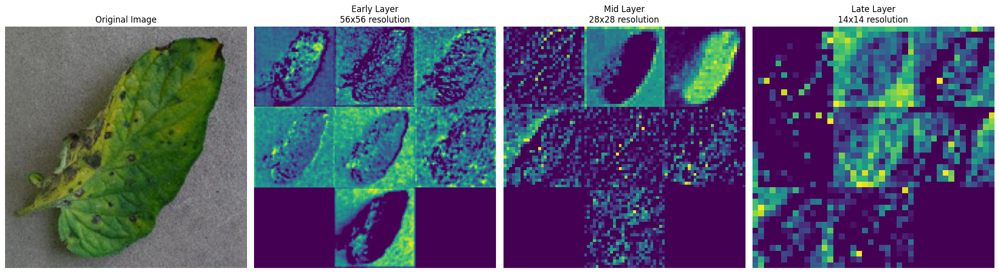


Feature Map Statistics:

early_layer:
Shape: torch.Size([256, 56, 56])
Mean activation: 0.1308
Std deviation: 0.1416
Max activation: 1.2200
Min activation: 0.0000

mid_layer:
Shape: torch.Size([512, 28, 28])
Mean activation: 0.0968
Std deviation: 0.1514
Max activation: 1.9371
Min activation: 0.0000

late_layer:
Shape: torch.Size([1024, 14, 14])
Mean activation: 0.0731
Std deviation: 0.1290
Max activation: 2.3004
Min activation: 0.0000

Analyzing image: e1376128-8bc6-4577-aa18-cdad9ca79d0b___Matt.S_CG 2657.JPG
Class: Tomato_Septoria_leaf_spot


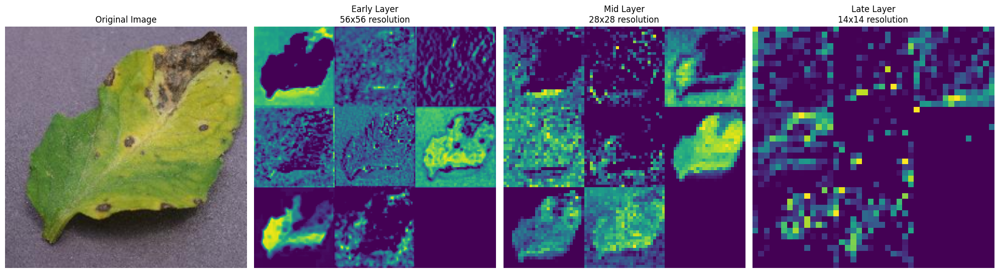


Feature Map Statistics:

early_layer:
Shape: torch.Size([256, 56, 56])
Mean activation: 0.1371
Std deviation: 0.1511
Max activation: 1.2073
Min activation: 0.0000

mid_layer:
Shape: torch.Size([512, 28, 28])
Mean activation: 0.1025
Std deviation: 0.1666
Max activation: 2.7352
Min activation: 0.0000

late_layer:
Shape: torch.Size([1024, 14, 14])
Mean activation: 0.0760
Std deviation: 0.1342
Max activation: 2.3276
Min activation: 0.0000

Visualizing EfficientNet feature maps:

Analyzing image: 384da385-aa8a-4412-b543-7ebc85133488___YLCV_GCREC 2568.JPG
Class: Tomato__Tomato_YellowLeaf__Curl_Virus


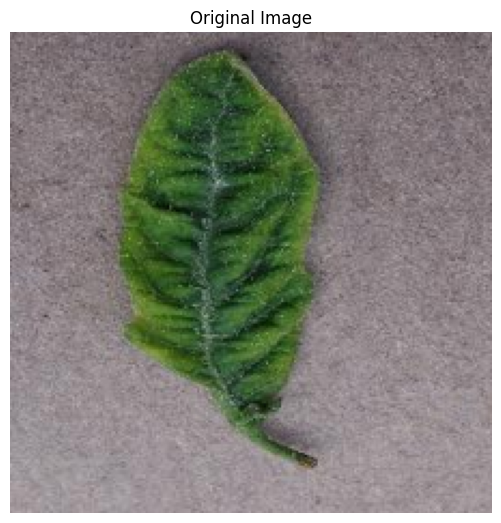


Feature Map Statistics:

Analyzing image: 6d2b6ab9-dd43-446a-ae14-0fc3fb12b9ca___GH_HL Leaf 265.2.JPG
Class: Tomato_healthy


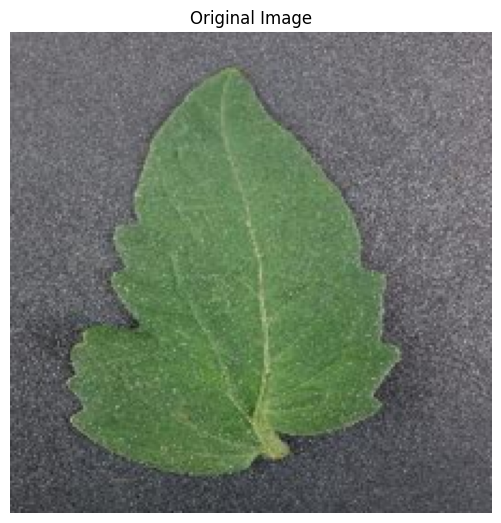


Feature Map Statistics:

Analyzing image: 18cb836c-f351-41e4-933a-fae2feb4b9ad___RS_Late.B 6050.JPG
Class: Tomato_Late_blight


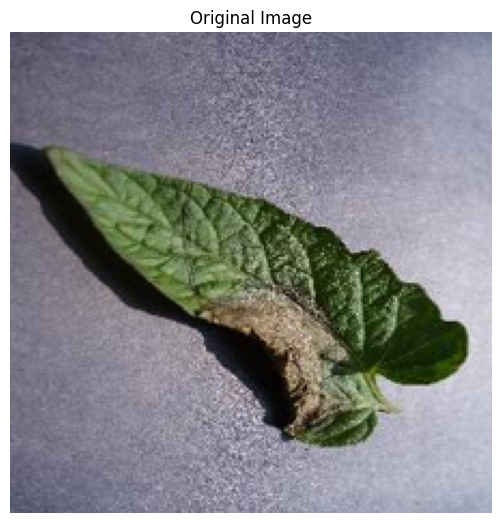


Feature Map Statistics:


In [148]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import random
import os
from typing import List, Tuple
import torch.nn as nn

class FeatureMapVisualizer:
    def __init__(self, model, device):
        self.model = model
        self.device = device
        self.features = {}
        self.setup_hooks()
        
    def setup_hooks(self):
        """Set up hooks to capture features from different layers"""
        def get_features(name):
            def hook(model, input, output):
                self.features[name] = output.detach()
            return hook
        
        # For ResNet50
        if hasattr(self.model, 'backbone'):
            self.model.backbone.layer1[0].register_forward_hook(get_features('early_layer'))
            self.model.backbone.layer2[0].register_forward_hook(get_features('mid_layer'))
            self.model.backbone.layer3[0].register_forward_hook(get_features('late_layer'))
        
        # For EfficientNet
        elif hasattr(self.model, 'features'):
            # Register hooks for early, middle, and late layers
            self.model.features[0].register_forward_hook(get_features('early_layer'))
            self.model.features[4].register_forward_hook(get_features('mid_layer'))
            self.model.features[8].register_forward_hook(get_features('late_layer'))
    
    def visualize_feature_maps(self, image_path: str, num_features: int = 8) -> None:
        """
        Visualize feature maps from different layers of the model
        Args:
            image_path: Path to the input image
            num_features: Number of feature maps to display per layer
        """
        # Load and preprocess image
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        
        image = Image.open(image_path).convert('RGB')
        input_tensor = transform(image).unsqueeze(0).to(self.device)
        
        # Get original image for display
        original_image = np.array(image.resize((224, 224)))
        
        # Forward pass
        self.model.eval()
        with torch.no_grad():
            _ = self.model(input_tensor)
        
        # Create figure
        plt.figure(figsize=(20, 10))
        
        # Display original image
        plt.subplot(1, 4, 1)
        plt.imshow(original_image)
        plt.title('Original Image', fontsize=12)
        plt.axis('off')
        
        # Display feature maps from different layers
        for idx, (layer_name, features) in enumerate(self.features.items(), 2):
            feature_maps = features[0].cpu()  # Get first image's features
            
            # Create a grid of feature maps
            grid_size = int(np.ceil(np.sqrt(num_features)))
            
            # Select random feature maps
            num_channels = feature_maps.shape[0]
            selected_channels = random.sample(range(num_channels), min(num_features, num_channels))
            
            plt.subplot(1, 4, idx)
            plt.title(f'{layer_name.replace("_", " ").title()}\n{feature_maps.shape[1]}x{feature_maps.shape[2]} resolution', 
                     fontsize=12)
            
            # Create composite image of feature maps
            composite = np.zeros((feature_maps.shape[1] * grid_size, 
                                feature_maps.shape[2] * grid_size))
            
            for i, channel in enumerate(selected_channels):
                if i >= num_features:
                    break
                    
                row = i // grid_size
                col = i % grid_size
                
                feature_map = feature_maps[channel].numpy()
                feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min() + 1e-8)
                
                composite[row * feature_maps.shape[1]:(row + 1) * feature_maps.shape[1],
                         col * feature_maps.shape[2]:(col + 1) * feature_maps.shape[2]] = feature_map
            
            plt.imshow(composite, cmap='viridis')
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Print feature statistics
        print("\nFeature Map Statistics:")
        for layer_name, features in self.features.items():
            feature_maps = features[0].cpu()
            print(f"\n{layer_name}:")
            print(f"Shape: {feature_maps.shape}")
            print(f"Mean activation: {feature_maps.mean():.4f}")
            print(f"Std deviation: {feature_maps.std():.4f}")
            print(f"Max activation: {feature_maps.max():.4f}")
            print(f"Min activation: {feature_maps.min():.4f}")

def visualize_random_samples(model, data_dir: str, num_samples: int = 3):
    """
    Visualize feature maps for random samples from the dataset
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    visualizer = FeatureMapVisualizer(model, device)
    
    # Get random samples
    all_images = []
    for root, _, files in os.walk(data_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                all_images.append(os.path.join(root, file))
    
    selected_images = random.sample(all_images, min(num_samples, len(all_images)))
    
    for image_path in selected_images:
        print(f"\nAnalyzing image: {os.path.basename(image_path)}")
        print(f"Class: {os.path.basename(os.path.dirname(image_path))}")
        visualizer.visualize_feature_maps(image_path)

# Run the visualization
print("Starting feature map visualization...")

try:
    if 'model_resnet50' in globals():
        print("\nVisualizing ResNet50 feature maps:")
        visualize_random_samples(model_resnet50, "dataset", num_samples=3)
    
    if 'model_efficientnet' in globals():
        print("\nVisualizing EfficientNet feature maps:")
        visualize_random_samples(model_efficientnet, "dataset", num_samples=3)

except Exception as e:
    print(f"Error during visualization: {str(e)}")
    
    # Print model architecture for debugging
    if 'model_resnet50' in globals():
        print("\nResNet50 Architecture:")
        print(model_resnet50)
    
    if 'model_efficientnet' in globals():
        print("\nEfficientNet Architecture:")
        print(model_efficientnet)

Found 18163 images

Example image paths:
dataset\Tomato_Late_blight\e4f561cc-0e83-4718-90bf-2648db94a4bb___GHLB2 Leaf 162.1.JPG
dataset\Tomato__Tomato_YellowLeaf__Curl_Virus\11fce96d-194a-473b-b982-9ec7e2b8d092___YLCV_GCREC 2083.JPG
dataset\Tomato_healthy\6fa01a78-0d8d-4ecf-b90f-4dbc2e89f2d9___RS_HL 0220.JPG
dataset\Tomato_Bacterial_spot\03af6874-872f-41e1-bce4-b3022bd7a9e6___GCREC_Bact.Sp 2995.JPG
dataset\Tomato__Tomato_YellowLeaf__Curl_Virus\3f5fc513-d7bb-49ba-aa11-bf01f36fa977___YLCV_GCREC 2061.JPG
Image: dataset\Potato___Early_blight\001187a0-57ab-4329-baff-e7246a9edeb0___RS_Early.B 8178.JPG
Predicted class: Potato___Early_blight
Confidence: 100.00%


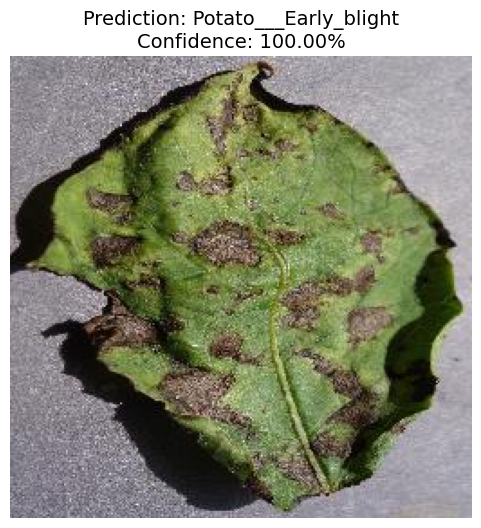

In [149]:
import matplotlib.pyplot as plt
from PIL import Image

# ---- Select a random test image ----
test_images = show_available_test_images("dataset")
if not test_images:
    print("No images found in dataset!")
else:
    test_image_path = test_images[0]  # Or random.choice(test_images)
    
    # ---- Predict using ResNet50 ----
    pred_class, confidence = predict_single_image(model_resnet50, test_image_path)
    print(f"Image: {test_image_path}")
    print(f"Predicted class: {pred_class}")
    print(f"Confidence: {confidence:.2f}%")
    
    # ---- Display the image with prediction ----
    img = Image.open(test_image_path)
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.title(f"Prediction: {pred_class}\nConfidence: {confidence:.2f}%", fontsize=14)
    plt.axis('off')
    plt.show()

Found 18163 images

Example image paths:
dataset\Tomato_Spider_mites_Two_spotted_spider_mite\6e486f1a-2df2-4764-a95b-a964f6de15ca___Com.G_SpM_FL 8587.JPG
dataset\Tomato_Leaf_Mold\7f283b23-4b47-47e2-9a9f-aa8619669018___Crnl_L.Mold 9044.JPG
dataset\Tomato_Spider_mites_Two_spotted_spider_mite\4ceaac12-5d26-494a-be0a-6f7e747a02c2___Com.G_SpM_FL 8963.JPG
dataset\Tomato_Late_blight\89d2801e-6359-4079-a4c2-0df4718d7800___GHLB_PS Leaf 1 Day 8.jpg
dataset\Tomato__Tomato_YellowLeaf__Curl_Virus\7e7e4ba7-67f0-4d86-99bc-03cc3dc80848___UF.GRC_YLCV_Lab 03012.JPG


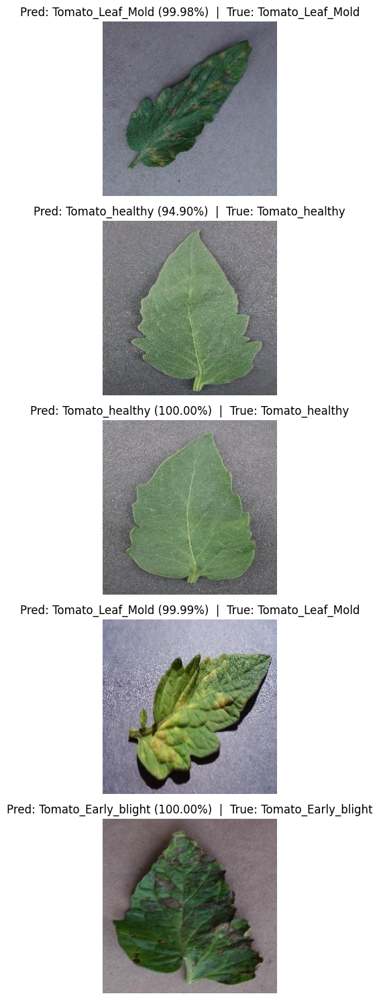

In [150]:
import matplotlib.pyplot as plt
from PIL import Image
import random
import os

def test_multiple_images(model, test_images, num_images=5):
    """
    Predicts and displays the results for multiple images using the provided model.
    """
    # Randomly select sample images
    selected_images = random.sample(test_images, min(num_images, len(test_images)))

    plt.figure(figsize=(8, num_images * 3))
    for idx, img_path in enumerate(selected_images):
        # Predict
        pred_class, confidence = predict_single_image(model, img_path)
        
        # True label from folder name
        true_label = os.path.basename(os.path.dirname(img_path))

        img = Image.open(img_path)
        plt.subplot(num_images, 1, idx + 1)
        plt.imshow(img)
        plt.title(f"Pred: {pred_class} ({confidence:.2f}%)  |  True: {true_label}", fontsize=12)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Use it like this:
test_images = show_available_test_images("dataset")
test_multiple_images(model_resnet50, test_images, num_images=5)

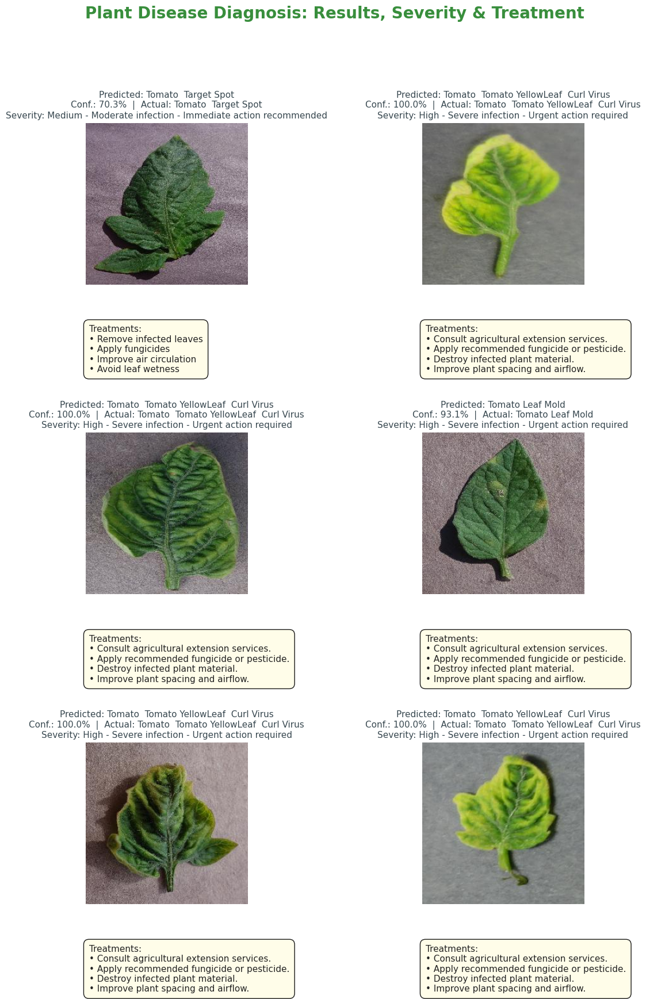

In [151]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from PIL import Image
import random
import os
import pickle
import numpy as np

# --- Treatment recommendations and healthy guidelines ---
treatment_recommendations = {
    "Pepper__bell___Bacterial_spot": [
        "Remove and destroy infected plants",
        "Apply copper-based bactericides",
        "Rotate crops for 1-2 years",
        "Avoid overhead irrigation"
    ],
    "Potato___Early_blight": [
        "Remove infected leaves",
        "Apply appropriate fungicides",
        "Maintain proper plant spacing",
        "Practice crop rotation"
    ],
    "Potato___Late_blight": [
        "Remove infected plants immediately",
        "Apply preventative fungicides",
        "Improve air circulation",
        "Plant resistant varieties"
    ],
    "Tomato__Bacterial_spot": [
        "Remove infected plants",
        "Apply copper-based bactericides",
        "Avoid overhead irrigation"
    ],
    "Tomato__Early_blight": [
        "Remove infected leaves",
        "Apply fungicides",
        "Mulch around plants",
        "Water at soil level"
    ],
    "Tomato__Late_blight": [
        "Remove infected plants",
        "Apply preventative fungicides",
        "Improve air circulation",
        "Avoid overhead watering"
    ],
    "Tomato__Leaf_Mold": [
        "Improve air circulation",
        "Apply fungicides",
        "Remove infected leaves",
        "Reduce humidity"
    ],
    "Tomato__Septoria_leaf_spot": [
        "Remove infected leaves",
        "Apply fungicides",
        "Mulch around plants",
        "Avoid overhead watering"
    ],
    "Tomato__Spider_mites_Two_spotted_spider_mite": [
        "Spray with strong water stream",
        "Apply insecticidal soap",
        "Introduce predatory mites",
        "Increase humidity"
    ],
    "Tomato__Target_Spot": [
        "Remove infected leaves",
        "Apply fungicides",
        "Improve air circulation",
        "Avoid leaf wetness"
    ],
    "Tomato__Tomato_Yellow_Leaf_Curl_Virus": [
        "Remove infected plants",
        "Control whitefly populations",
        "Use reflective mulches",
        "Plant resistant varieties"
    ],
    "Tomato__Tomato_mosaic_virus": [
        "Remove infected plants",
        "Sanitize tools and hands",
        "Control aphids",
        "Plant resistant varieties"
    ]
}

default_healthy_practices = [
    "Maintain proper watering schedule",
    "Ensure adequate sunlight",
    "Fertilize appropriately for plant type",
    "Monitor regularly for signs of disease"
]

def predict_single_image_and_get_label(model, image_path):
    with open('label_encoder.pkl', 'rb') as f:
        label_encoder = pickle.load(f)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(image_tensor)
        probs = torch.nn.functional.softmax(outputs, dim=1)[0]
        confidence = torch.max(probs).item() * 100
        pred_class = label_encoder.inverse_transform([torch.argmax(probs).item()])[0]
    return pred_class, confidence

def get_severity(pred_class, confidence):
    """Returns severity grading and message."""
    if "healthy" in pred_class.lower():
        return "Low", "Plant appears healthy"
    elif confidence < 60:
        return "Low", "Early stage - Monitor closely"
    elif confidence < 80:
        return "Medium", "Moderate infection - Immediate action recommended"
    else:
        return "High", "Severe infection - Urgent action required"

def display_project_findings_with_severity(model, data_dir, num_samples=6):
    """
    Shows grid of input image, predicted/actual, confidence, severity,
    and recommendation/tips, all at once!
    """
    test_images = []
    for disease_folder in os.listdir(data_dir):
        folder_path = os.path.join(data_dir, disease_folder)
        if os.path.isdir(folder_path):
            img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            for img in img_files:
                test_images.append((os.path.join(folder_path, img), disease_folder))
    if not test_images:
        print("No images found in dataset!")
        return

    selected = random.sample(test_images, min(len(test_images), num_samples))
    n_col = 2
    n_row = int(np.ceil(num_samples / n_col))

    plt.figure(figsize=(12, n_row * 6))
    gs = GridSpec(n_row, n_col)
    plt.suptitle("Plant Disease Diagnosis: Results, Severity & Treatment", fontsize=20, fontweight='bold', color="#388e3c")
    for idx, (image_path, actual_class) in enumerate(selected):
        pred_class, confidence = predict_single_image_and_get_label(model, image_path)

        # Severity
        severity, severity_message = get_severity(pred_class, confidence)

        # Get recommendations/tips
        if "healthy" in pred_class.lower():
            results_text = "Healthy Practices:\n" + '\n'.join([f"• {t}" for t in default_healthy_practices])
            rec_bg = "#e8f5e9"
        else:
            steps = treatment_recommendations.get(pred_class, [
                "Consult agricultural extension services.",
                "Apply recommended fungicide or pesticide.",
                "Destroy infected plant material.",
                "Improve plant spacing and airflow."
            ])
            results_text = "Treatments:\n" + '\n'.join([f"• {t}" for t in steps])
            rec_bg = "#fffde7"

        # Plot image and info
        ax = plt.subplot(gs[idx])
        img = Image.open(image_path)
        ax.imshow(img)
        ax.axis('off')
        pred_label = pred_class.replace("_", " ")
        actual_label = actual_class.replace("_", " ")
        ax.set_title(f"Predicted: {pred_label}\n"
                     f"Conf.: {confidence:.1f}%  |  Actual: {actual_label}\n"
                     f"Severity: {severity} - {severity_message}",
                     fontsize=11, color="#37474f")
        ax.text(0.02, -0.25, results_text, fontsize=11, color="#222", 
                bbox=dict(facecolor=rec_bg, alpha=0.90, boxstyle='round,pad=0.6'),
                transform=ax.transAxes, va='top')
    plt.tight_layout(rect=[0,0,1,0.93])
    plt.show()

# ----- Run this cell (after training & model loading) -----
display_project_findings_with_severity(model_resnet50, "dataset", num_samples=6)

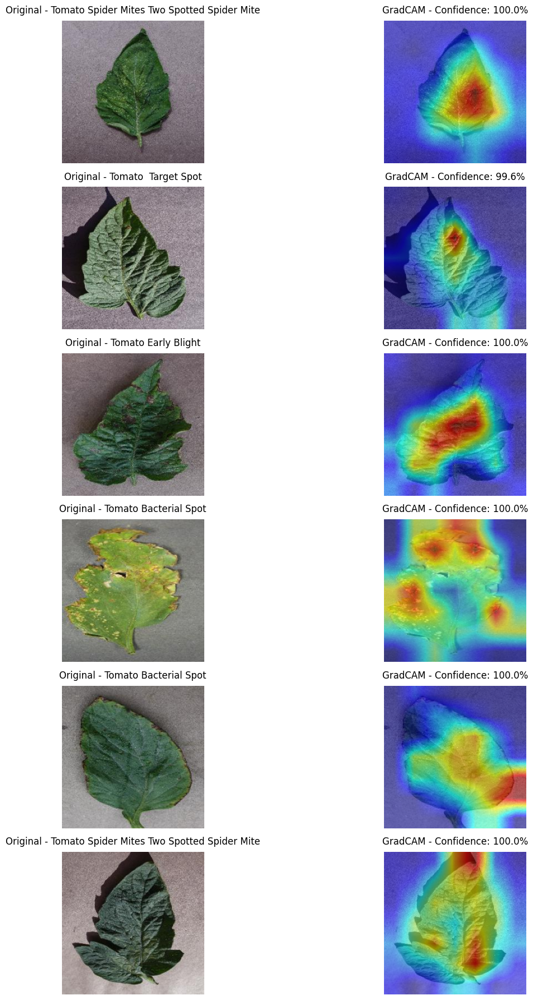

In [152]:
import torch
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import os

class GradCAMWrapper:
    def __init__(self, model):
        self.model = model
        self.target_layer = model.backbone.layer4[-1]
        self.cam = GradCAM(model=model, target_layers=[self.target_layer])
        
    def generate_cam(self, input_tensor):
        grayscale_cam = self.cam(input_tensor=input_tensor, targets=None)
        grayscale_cam = grayscale_cam[0, :]
        return grayscale_cam

def display_disease_analysis(model, data_dir, num_samples=6):
    """
    Display disease analysis with GradCAM heatmaps and confidence as percentage
    """
    # Determine device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    
    # Initialize GradCAM
    grad_cam_wrapper = GradCAMWrapper(model)
    
    # Set up the figure
    plt.style.use('default')
    fig = plt.figure(figsize=(15, num_samples * 3))
    
    # Image preprocessing
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    
    # Get random samples
    classes = os.listdir(data_dir)
    for idx in range(num_samples):
        try:
            # Random class selection
            class_name = np.random.choice(classes)
            class_dir = os.path.join(data_dir, class_name)
            image_name = np.random.choice(os.listdir(class_dir))
            image_path = os.path.join(class_dir, image_name)
            
            # Load and preprocess image
            image = Image.open(image_path).convert('RGB')
            input_tensor = transform(image).unsqueeze(0)
            input_tensor = input_tensor.to(device)
            
            # Generate prediction
            model.eval()
            with torch.no_grad():
                output = model(input_tensor)
                pred_prob = torch.nn.functional.softmax(output, dim=1)
                pred_class = torch.argmax(pred_prob).item()
                confidence = pred_prob[0][pred_class].item() * 100  # Convert to percentage
            
            # Generate GradCAM
            grayscale_cam = grad_cam_wrapper.generate_cam(input_tensor)
            
            # Convert image for visualization
            rgb_img = np.array(image.resize((224, 224))) / 255.0
            cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
            
            # Format class name for better display
            formatted_class_name = class_name.replace('_', ' ').title()
            
            # Display results
            ax = fig.add_subplot(num_samples, 2, idx*2 + 1)
            ax.imshow(rgb_img)
            ax.set_title(f'Original - {formatted_class_name}', pad=10)
            ax.axis('off')
            
            ax = fig.add_subplot(num_samples, 2, idx*2 + 2)
            ax.imshow(cam_image)
            ax.set_title(f'GradCAM - Confidence: {confidence:.1f}%', pad=10)
            ax.axis('off')
            
        except Exception as e:
            print(f"Error processing image {idx}: {str(e)}")
            continue
    
    plt.tight_layout()
    plt.show()

# Call the function with your trained ResNet50 model
display_disease_analysis(model_resnet50, "dataset", num_samples=6)